In [1]:
import os

import tqdm
import torch
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn

import vari
import vari.datasets
import vari.models
import vari.inference
from vari.layers import GaussianLayer, BernoulliSample

from sklearn.datasets import make_circles

In [2]:
experiments_dir = '/nas/experiments/sacred/models/'
mpl.style.use('default')

## Select models and data

In [4]:
#dataset_name = 'Moons'
dataset_name = 'Spirals'

if dataset_name == 'Moons':
    run_ids = dict(
        vae=6509,
        hvae=6511,
    )
elif dataset_name == 'Spirals':
    run_ids = dict(
        vae=6512,
        hvae=6513,
    )


## Choose data

### Spirals

In [5]:
def get_spirals():
    train_dataset = vari.datasets.Spirals(n_samples=10000, noise=0.00, rotation=0, start_radius=np.pi, rounds=1)
    x_train = train_dataset.examples
    y_train = train_dataset.labels
    y_train = np.argmax(y_train, -1)
    y_train_onehot = np.eye(2)[y_train]
    
    test1_dataset = vari.datasets.Spirals(n_samples=10000, noise=0.05, rotation=np.pi/2, start_radius=0, rounds=1.5)
    x_test1 = test1_dataset.examples
    y_test1 = test1_dataset.labels
    y_test1 = np.argmax(y_test1, -1)
    y_test1_onehot = np.eye(2)[y_test1]
    
    test2_dataset = vari.datasets.Spirals(n_samples=10000, noise=0.05, rotation=np.pi, start_radius=3*np.pi, rounds=0.5)
    x_test2 = test2_dataset.examples
    y_test2 = test2_dataset.labels
    y_test2 = np.argmax(y_test2, -1)
    y_test2_onehot = np.eye(2)[y_test2]
    
    return x_train, y_train, x_test1, y_test1, x_test2, y_test2

### Moons

In [6]:
def get_moons():
    train_dataset = vari.datasets.Moons(n_samples=10000, noise=0.00)
    x_train = train_dataset.examples
    y_train = train_dataset.labels.argmax(axis=-1)

    # TEST1 IS HALF MOONS MIRRORED ALONG X AXIS COMPARED TO TRAIN
    test1_dataset = vari.datasets.Moons(n_samples=10000, noise=0.00, seed=1)
    x_test1 = test1_dataset.examples
    y_test1 = test1_dataset.labels.argmax(axis=-1)
    x_test1[y_test1==0, 1] = -(x_test1[y_test1==0, 1] - 0.0) + 0.0 # -x_test1[y_test1==0]
    x_test1[y_test1==1, 1] = -(x_test1[y_test1==1, 1] - 0.5) + 0.5

    # TEST2 IS EACH MOON SHRUNK BY A FACTOR 1.25 AROUND ITS SYMMETRICAL CENTER
    test2_dataset = vari.datasets.Moons(n_samples=10000, noise=0.00, seed=2)
    x_test2 = test2_dataset.examples
    y_test2 = test2_dataset.labels.argmax(axis=-1)
    x_test2[y_test2==0] = (x_test2[y_test2==0] - np.array([0.0, 0.0])) / 1.25 + np.array([0.0, 0.0])
    x_test2[y_test2==1] = (x_test2[y_test2==1] - np.array([1.0, 0.5])) / 1.25 + np.array([1.0, 0.5])
    
    return x_train, y_train, x_test1, y_test1, x_test2, y_test2

In [7]:
if dataset_name == 'Moons':
    x_train, y_train, x_test1, y_test1, x_test2, y_test2 = get_moons()
elif dataset_name == 'Spirals':
    x_train, y_train, x_test1, y_test1, x_test2, y_test2 = get_spirals()

### Compute meshgrid

In [8]:
def make_meshgrid(x_lim, y_lim, nx=50, ny=50):
    """Returns a meshgrid over the 2D range specified by x_lim and y_lim"""
    x = np.linspace(*x_lim, nx)
    y = np.linspace(*y_lim, ny)
    xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
    x_meshgrid = []
    for i in range(nx):   
        for j in range(ny):
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if not i == 0:
                x_meshgrid += [[xv[j,i-1], yv[j,i-1]]]
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if not j == 0:
                x_meshgrid += [[xv[j-1,i], yv[j-1,i]]]
            x_meshgrid += [[xv[j,i], yv[j,i]]]
            if j == ny-1:
                for k in range(ny):
                    x_meshgrid += [[xv[ny-(k+1),i], yv[ny-(k+1),i]]]

    return np.array(x_meshgrid)

In [9]:
x_min = np.min([x_train[:,0].min(), x_test1[:,0].min(), x_test2[:,0].min()])
x_max = np.max([x_train[:,0].max(), x_test1[:,0].max(), x_test2[:,0].max()])
y_min = np.min([x_train[:,1].min(), x_test1[:,1].min(), x_test2[:,1].min()])
y_max = np.max([x_train[:,1].max(), x_test1[:,1].max(), x_test2[:,1].max()])

In [10]:
x_train_meshgrid = make_meshgrid(
    x_lim=(x_min, x_max),
    y_lim=(y_min, y_max),
    nx=50,
    ny=50
)

In [11]:
x_train_meshgrid_large = make_meshgrid(
    x_lim=(x_min - np.abs(x_min * 3), x_max + np.abs(x_max * 3)),
    y_lim=(y_min - np.abs(y_min * 3), y_max + np.abs(y_max * 3)),
    nx=150,
    ny=150
)

### Visualize dataset

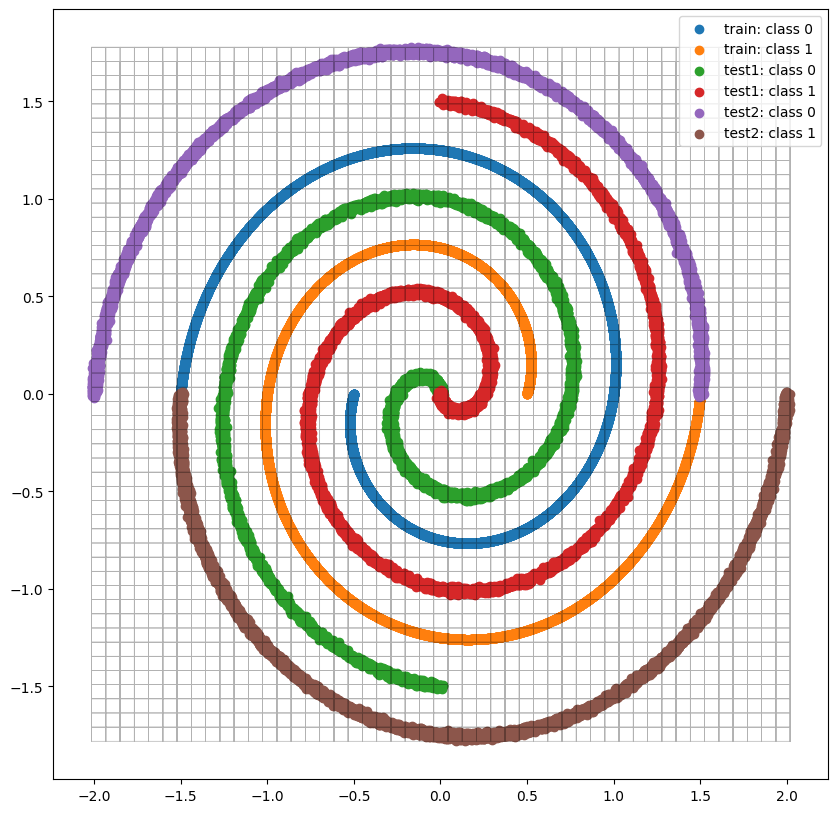

In [12]:
fig = plt.figure(figsize=(10, 10))
ax1 = fig.add_subplot(1, 1, 1)
ax1.plot(x_train_meshgrid[:,0], x_train_meshgrid[:,1], c="black", alpha=.3, linewidth=.5)
ax1.scatter(x_train[y_train==0,0], x_train[y_train==0,1], c='C0', label="train: class 0")
ax1.scatter(x_train[y_train==1,0], x_train[y_train==1,1], c='C1', label="train: class 1")
ax1.scatter(x_test1[y_test1==0,0], x_test1[y_test1==0,1], c='C2', label="test1: class 0")
ax1.scatter(x_test1[y_test1==1,0], x_test1[y_test1==1,1], c='C3', label="test1: class 1")
ax1.scatter(x_test2[y_test2==0,0], x_test2[y_test2==0,1], c='C4', label="test2: class 0")
ax1.scatter(x_test2[y_test2==1,0], x_test2[y_test2==1,1], c='C5', label="test2: class 1")
ax1.legend()
fig.show()

## Load models

In [13]:
def load_models(run_ids):
    models = dict()
    for model_abbr, model_name in [('vae', 'VariationalAutoencoder'),
                                   #('avae', 'AuxilliaryVariationalAutoencoder'),
                                   ('hvae', 'HierarchicalVariationalAutoencoder')]:
        run_id = str(run_ids[model_abbr])

        model = getattr(vari.models.vae, model_name)
        try:
            # Load the saved kwargs
            kwargs = torch.load(
                os.path.join(experiments_dir, run_id, 'model_kwargs.pkl')
            )
            model = model(**kwargs)
        except Exception as exc:
            try:
                # Try default config
                kwargs = vari.models.get_default_model_config(model_name, dataset_name)
                model = model(**kwargs)
            except Exception as exc:
                print(model_abbr, exc)
                models[model_abbr] = None
                continue

        try:
            model.load_state_dict(torch.load(
                os.path.join(experiments_dir, run_id, 'model_state_dict.pkl'),
                map_location=torch.device('cpu')
            ))
            models[model_abbr] = model
            print(f'Loaded {model_abbr.upper()} ID {run_id}')
        except Exception as exc:
            print(model_abbr, exc)
            models[model_abbr] = None
    return models

In [14]:
models = load_models(run_ids)
vae, hvae = models['vae'], models['hvae']

Loaded VAE ID 6512
Loaded HVAE ID 6513


## Visualize latent space

In [15]:
def plot_vectors_and_mesh(vectors, mesh, fig=None, ax=None, figsize=(20, 20), color='C0', alpha=0.4, label='train', label_ids=None):
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(1, 1, 1)
        
    ax.plot(mesh[:,0], mesh[:,1], c='black', alpha=.2, linewidth=.5)
    ax.scatter(mesh[:,0], mesh[:,1], c=[(.8, .8, .8, .8)], alpha=.5, s=5.)
    if label_ids is not None:
        for i in np.unique(label_ids):
            ax.scatter(vectors[label_ids==i, 0], vectors[label_ids==i, 1], c=f'C{i}', alpha=alpha, label=f"{label}:class{i}")
    else:
        ax.scatter(vectors[:,0], vectors[:,1], c=color, alpha=alpha, label=label)
    #ax1.scatter(vae_qz_mu_x2[:,0], vae_qz_mu_x2[:,1], c=[test1_0], alpha=0.4, label="test1")
    # ax1.axis('off')
    ax.legend()
    return fig, ax

### VAE

In [41]:
with torch.no_grad():
    vae_qz_train = vae.encode(torch.FloatTensor(x_train))
    vae_qz_test1 = vae.encode(torch.FloatTensor(x_test1))
    vae_qz_test2 = vae.encode(torch.FloatTensor(x_test2))
    vae_qz_mesh = vae.encode(torch.FloatTensor(x_train_meshgrid))

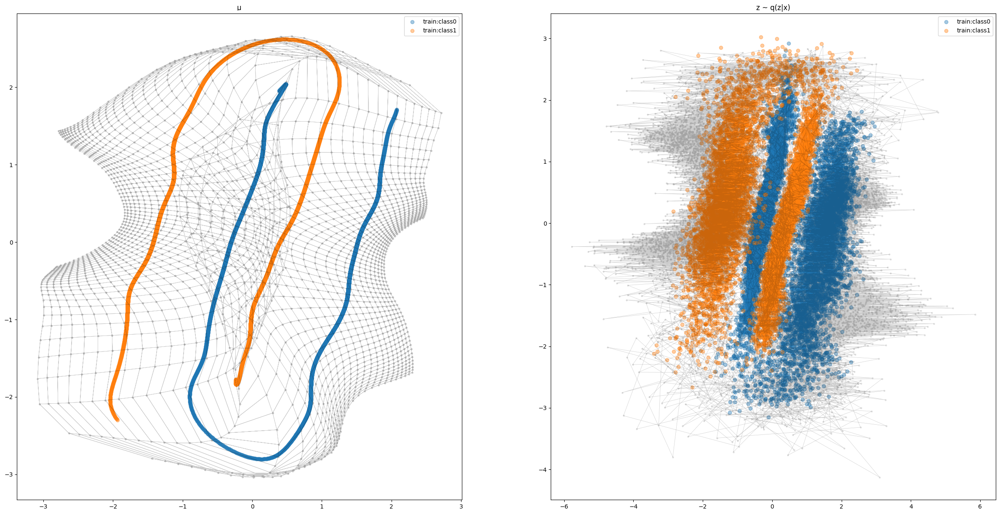

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
plot_vectors_and_mesh(vae_qz_train[1].mean, vae_qz_mesh[1].mean, label_ids=y_train, ax=ax1)
plot_vectors_and_mesh(vae_qz_train[0], vae_qz_mesh[0], label_ids=y_train, ax=ax2)
ax1.set_title('µ')
ax2.set_title('z ~ q(z|x)')
plt.show()

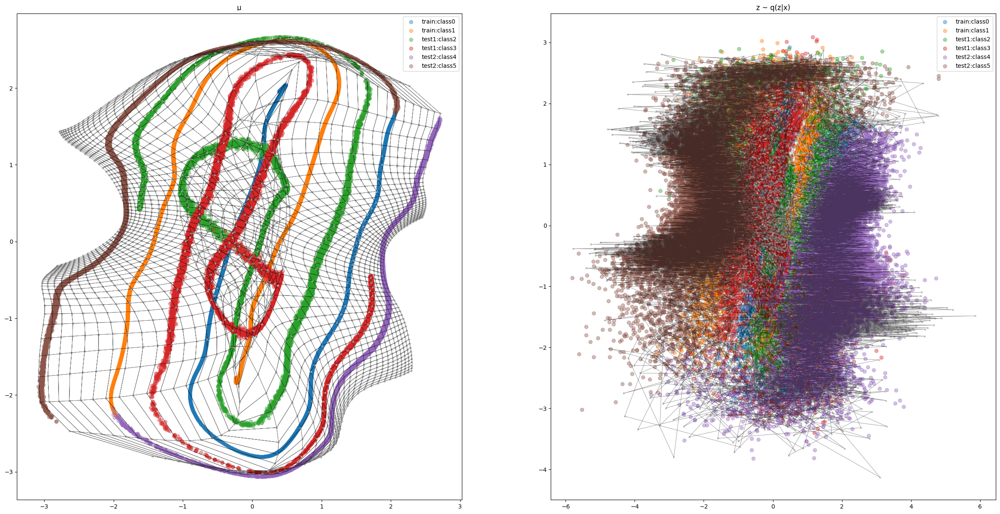

In [43]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
plot_vectors_and_mesh(vae_qz_train[1].mean, vae_qz_mesh[1].mean, label_ids=y_train, ax=ax1)
plot_vectors_and_mesh(vae_qz_test1[1].mean, vae_qz_mesh[1].mean, label_ids=y_test1+2, ax=ax1, label='test1')
plot_vectors_and_mesh(vae_qz_test2[1].mean, vae_qz_mesh[1].mean, label_ids=y_test2+4, ax=ax1, label='test2')
plot_vectors_and_mesh(vae_qz_train[0], vae_qz_mesh[0], label_ids=y_train, ax=ax2)
plot_vectors_and_mesh(vae_qz_test1[0], vae_qz_mesh[0], label_ids=y_test1+2, ax=ax2, label='test1')
plot_vectors_and_mesh(vae_qz_test2[0], vae_qz_mesh[0], label_ids=y_test2+4, ax=ax2, label='test2')
ax1.set_title('µ')
ax2.set_title('z ~ q(z|x)')
plt.show()

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.set_title('Aggregate posterior q(z) given training data')
ax2.set_title('Aggregate posterior q(z) of "test2" data')
vae_qz_train_sample = vae_qz_train.sample()
vae_qz_test2_sample = vae_qz_test2.sample()
seaborn.kdeplot(vae_qz_train_sample[:, 0].numpy(),
                data2=vae_qz_train_sample[:, 1].numpy(),
                shade=True,
                cbar=True,
                ax=ax1)
seaborn.kdeplot(vae_qz_test2_sample[:, 0].numpy(),
                data2=vae_qz_test2_sample[:, 1].numpy(),
                shade=True,
                cbar=True,
                ax=ax2)

In [ ]:
fig, ax1 = plt.subplots(1, 1, figsize=(10, 5))
ax1.set_title('Aggregate posterior q(z) given training data')
seaborn.kdeplot(vae_qz_x_train[y_train==0, 0].numpy(),
                data2=vae_qz_x_train[y_train==0, 1].numpy(),
                cmap='Blues',
                shade=True,
                shade_lowest=False,
                cbar=True,
                ax=ax1)
seaborn.kdeplot(vae_qz_x_train[y_train==1, 0].numpy(),
                data2=vae_qz_x_train[y_train==1, 1].numpy(),
                cmap='Reds',
                shade=True,
                shade_lowest=False,
                cbar=True,
                ax=ax1)

In [ ]:
fig, ax1 = plt.subplots(1, 1)
ax1.set_title('Aggregate posterior q(z) on test1 and test2')
seaborn.kdeplot(data=vae_qz_x_test1[:, 0].numpy(),
                data2=vae_qz_x_test1[:, 1].numpy(),
                shade=True,
                shade_lowest=False,
                ax=ax1)
seaborn.kdeplot(data=vae_qz_x_test2[:, 0].numpy(),
                data2=vae_qz_x_test2[:, 1].numpy(),
                line_width=1,
                ax=ax1)

### HVAE

In [22]:
with torch.no_grad():
    latents_train = hvae.encode(torch.FloatTensor(x_train))
    latents_test1 = hvae.encode(torch.FloatTensor(x_test1))
    latents_test2 = hvae.encode(torch.FloatTensor(x_test2))
    latents_mesh = hvae.encode(torch.FloatTensor(x_train_meshgrid))

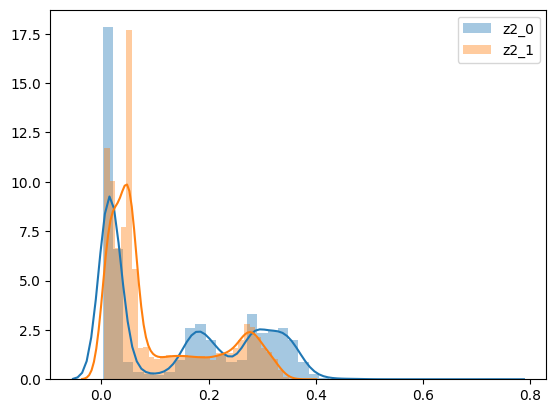

In [23]:
fig, ax = plt.subplots(1, 1)
seaborn.distplot(latents_train['z2'][1].variance[:,0], label='z2_0', ax=ax)
seaborn.distplot(latents_train['z2'][1].variance[:,1], label='z2_1', ax=ax)
ax.legend()

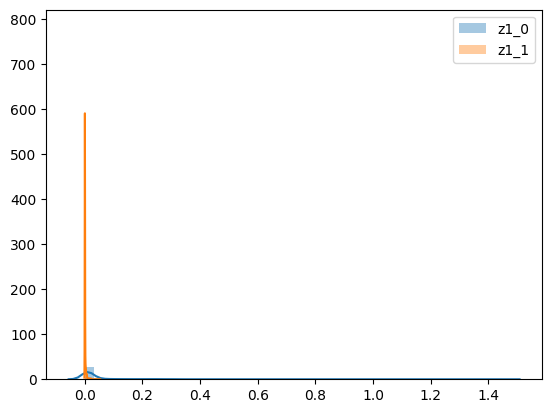

In [24]:
fig, ax = plt.subplots(1, 1)
seaborn.distplot(latents_train['z1'][1].variance[:,0], label='z1_0', ax=ax)
seaborn.distplot(latents_train['z1'][1].variance[:,1], label='z1_1', ax=ax)
ax.legend()

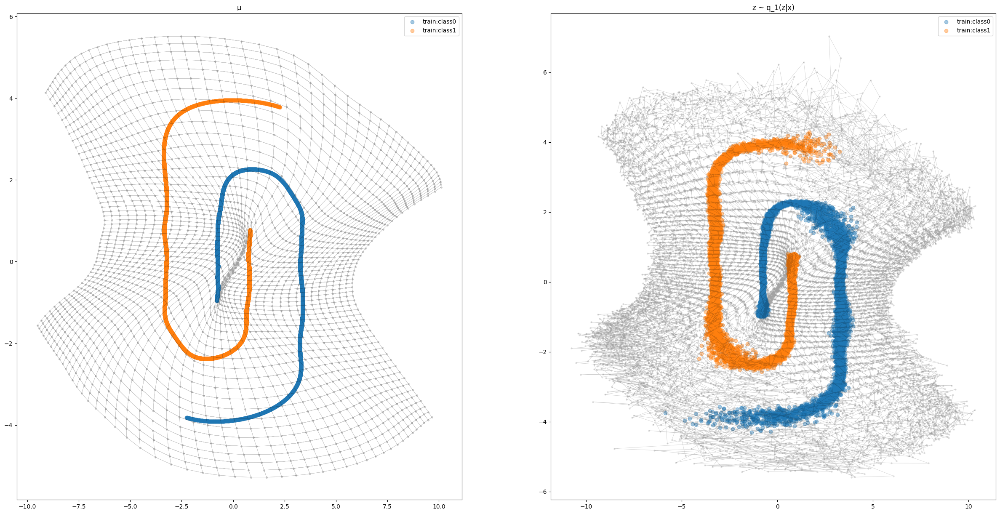

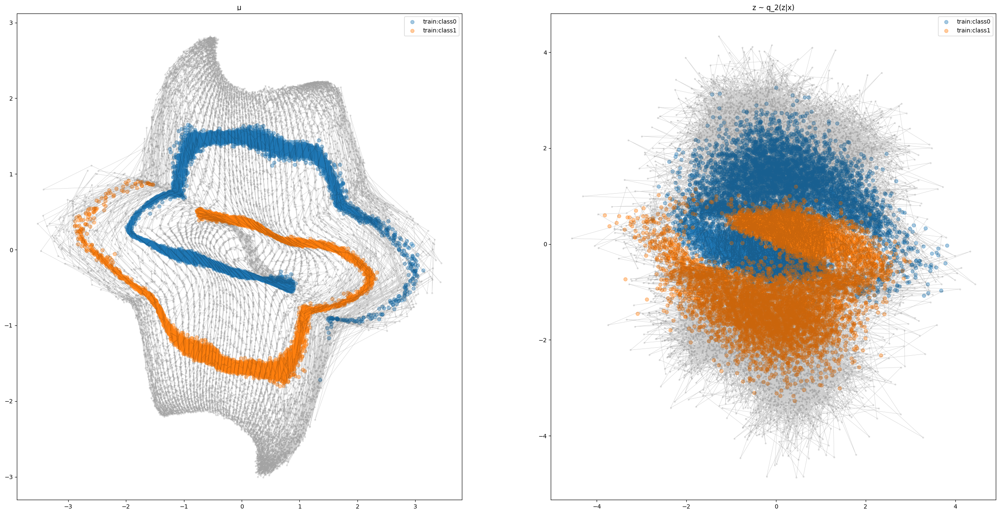

In [25]:
for i_layer, name in enumerate(latents_train.keys(), start=1):
    hvae_qz_x_train = latents_train[name][0]
    hvae_qz_mu_x_train = latents_train[name][1].mean
    hvae_qz_mesh = latents_mesh[name][0]
    hvae_qz_mu_mesh = latents_mesh[name][1].mean
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
    plot_vectors_and_mesh(hvae_qz_mu_x_train, hvae_qz_mu_mesh, label_ids=y_train, ax=ax1)
    plot_vectors_and_mesh(hvae_qz_x_train, hvae_qz_mesh, label_ids=y_train, ax=ax2)
    ax1.set_title('µ')
    ax2.set_title(f'z ~ q_{i_layer}(z|x)')
    plt.show()

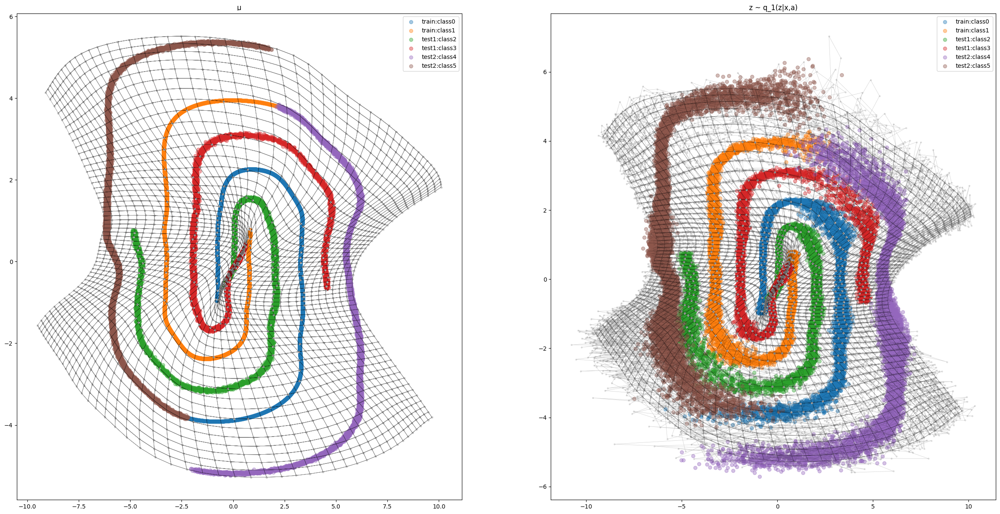

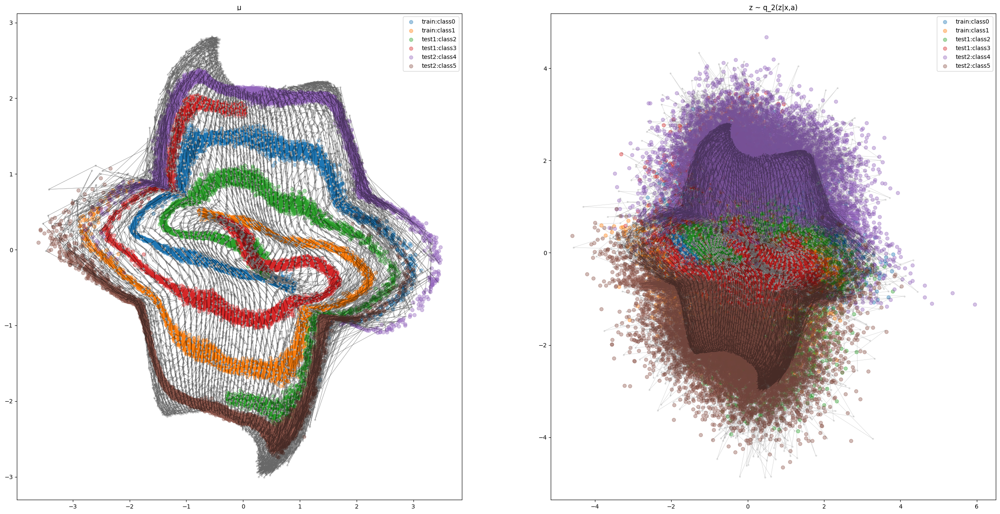

In [26]:
for i_layer, name in enumerate(latents_train.keys(), start=1):
    hvae_qz_x_train = latents_train[name][0]
    hvae_qz_mu_x_train = latents_train[name][1].mean
    hvae_qz_mesh = latents_mesh[name][0]
    hvae_qz_mu_mesh = latents_mesh[name][1].mean
   
    hvae_qz_x_test1 = latents_test1[name][0]
    hvae_qz_mu_x_test1 = latents_test1[name][1].mean
    hvae_qz_x_test2 = latents_test2[name][0]
    hvae_qz_mu_x_test2 = latents_test2[name][1].mean
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 15))
    plot_vectors_and_mesh(hvae_qz_mu_x_train, hvae_qz_mu_mesh, label_ids=y_train, ax=ax1)
    plot_vectors_and_mesh(hvae_qz_mu_x_test1, hvae_qz_mu_mesh, label_ids=y_test1+2, ax=ax1, label='test1')
    plot_vectors_and_mesh(hvae_qz_mu_x_test2, hvae_qz_mu_mesh, label_ids=y_test2+4, ax=ax1, label='test2')
    plot_vectors_and_mesh(hvae_qz_x_train, hvae_qz_mesh, label_ids=y_train, ax=ax2)
    plot_vectors_and_mesh(hvae_qz_x_test1, hvae_qz_mu_mesh, label_ids=y_test1+2, ax=ax2, label='test1')
    plot_vectors_and_mesh(hvae_qz_x_test2, hvae_qz_mu_mesh, label_ids=y_test2+4, ax=ax2, label='test2')
    ax1.set_title('µ')
    ax2.set_title(f'z ~ q_{i_layer}(z|x,a)')
    plt.show()

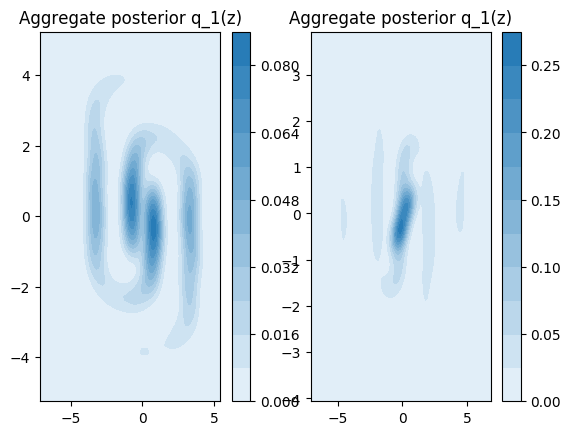

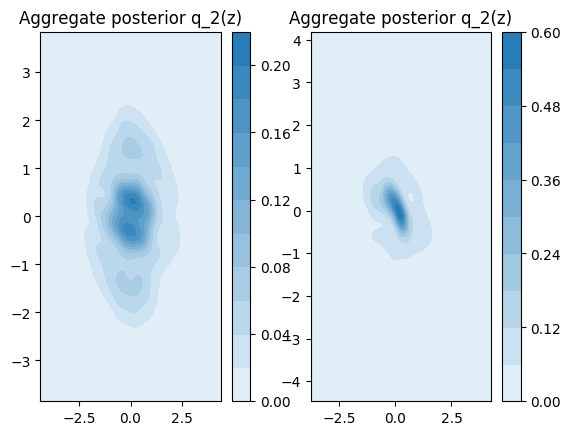

In [28]:
# TODO density as contours and labels as shades?

for i_layer, name in enumerate(latents_train.keys(), start=1):
    hvae_qz_x_train = latents_train[name][0]
    hvae_qz_mu_x_train = latents_train[name][1].mean
    
    hvae_qz_x_test1 = latents_test1[name][0]
    hvae_qz_mu_x_test1 = latents_test1[name][1].mean
    
    fig, (ax1, ax2) = plt.subplots(1, 2)
    ax1.set_title(f'Aggregate posterior q_{i_layer}(z)')
    seaborn.kdeplot(hvae_qz_x_train[:, 0].numpy(),
                    data2=hvae_qz_x_train[:, 1].numpy(),
                    shade=True,
                    cbar=True,
                    ax=ax1)
    ax2.set_title(f'Aggregate posterior q_{i_layer}(z)')
    seaborn.kdeplot(hvae_qz_x_test1[:, 0].numpy(),
                    data2=hvae_qz_x_test1[:, 1].numpy(),
                    shade=True,
                    cbar=True,
                    ax=ax2)

## Visualize reconstruction

In [30]:
n_samples = 1000
x_originals = torch.FloatTensor(x_train[:n_samples, :])
with torch.no_grad():
    hvae_px_reconstructions = hvae(x_originals)
    vae_px_reconstructions = vae(x_originals)

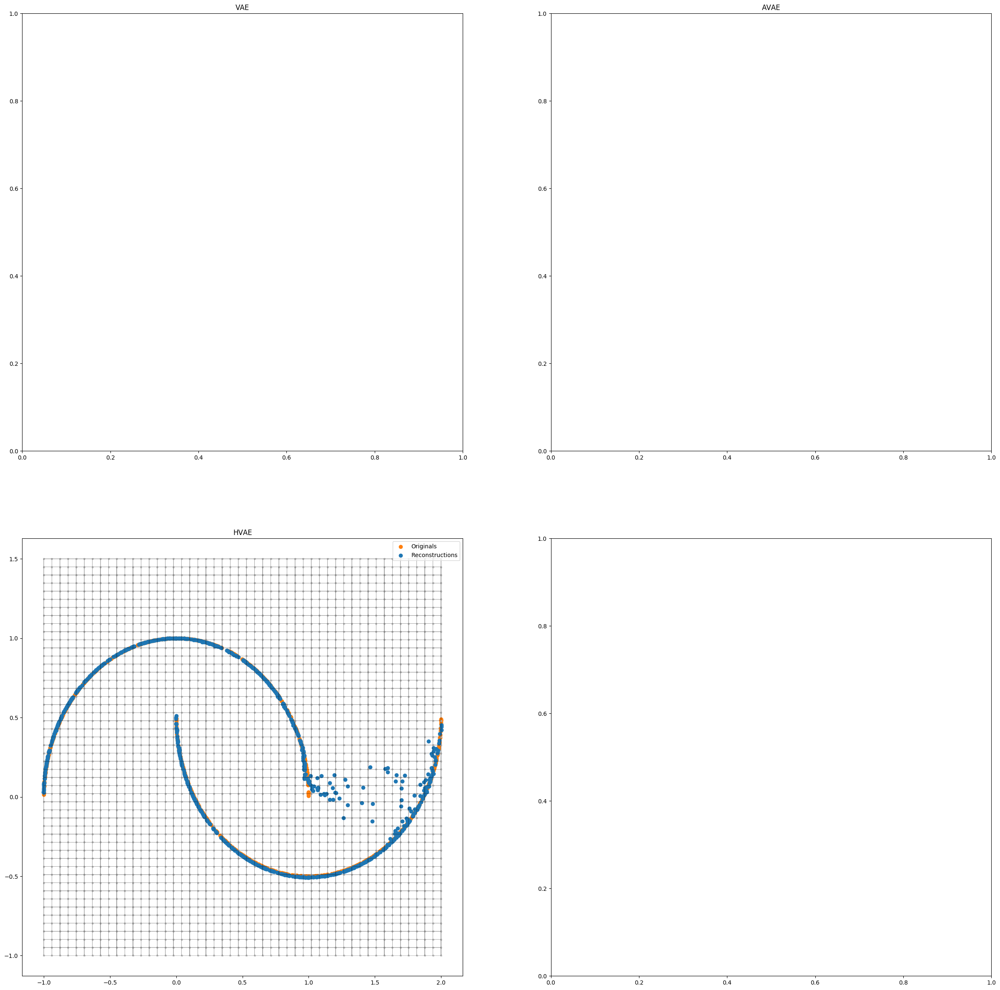

In [31]:
fig, axes = plt.subplots(2, 2, figsize=(30, 30))
ax1, ax2, ax3, ax4 = [ax for ax_row in axes for ax in ax_row ]
#plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax1)
#plot_vectors_and_mesh(vae_px_reconstructions.mean, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax1)
#plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax2)
#plot_vectors_and_mesh(avae_p_x_mu, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax2)
plot_vectors_and_mesh(x_originals, x_train_meshgrid, alpha=1, color='C1', label='Originals', ax=ax3)
plot_vectors_and_mesh(hvae_px_reconstructions.mean, x_train_meshgrid, alpha=1, label='Reconstructions', ax=ax3)
ax1.set_title('VAE')
ax2.set_title('AVAE')
ax3.set_title('HVAE')
plt.show()

## Visualize sampling

In [32]:
n_samples = 10000
p_z_samples = torch.randn((n_samples, 2))

In [35]:
with torch.no_grad():
    hvae_p_x_samples = hvae.generate(z=p_z_samples)
    vae_p_x_samples = vae.generate(z=p_z_samples)


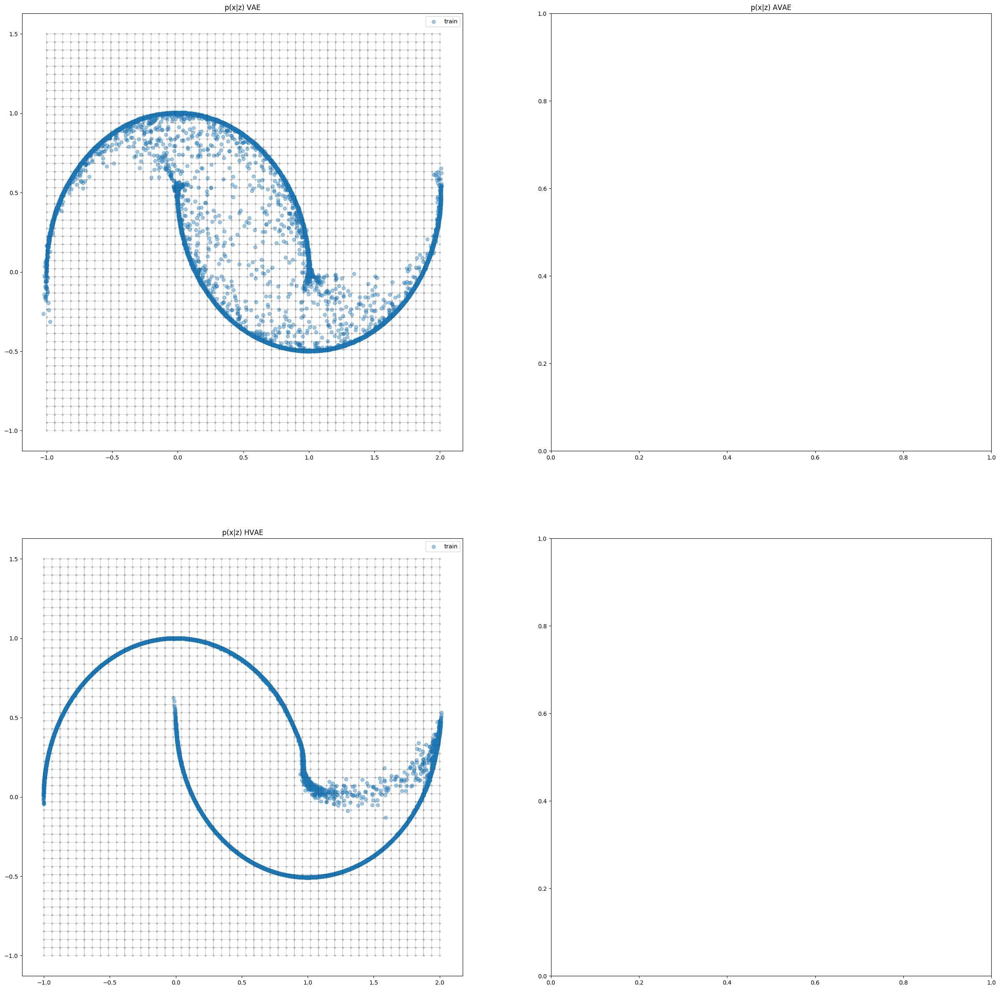

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(30, 30))
ax1, ax2, ax3, ax4 = [ax for ax_row in axes for ax in ax_row ]
plot_vectors_and_mesh(vae_p_x_samples.mean, x_train_meshgrid, ax=ax1)
#plot_vectors_and_mesh(avae_p_x_mu, x_train_meshgrid, ax=ax2)
plot_vectors_and_mesh(hvae_p_x_samples.mean, x_train_meshgrid, ax=ax3)
ax1.set_title('p(x|z) VAE')
ax2.set_title('p(x|z) AVAE')
ax3.set_title('p(x|z) HVAE')
plt.show()

## Visualize ELBO

In [31]:
def compute_elbo_no_iw(model, x):
    with torch.no_grad():
        x = torch.FloatTensor(x)

        px = model.forward(x)

        kl_divergence = vae.kl_divergence
        likelihood = px.log_prob(x)
        elbo = likelihood - kl_divergence

        return elbo, kl_divergence, likelihood

def compute_elbo_iw(model, x, importance_samples=1):
    with torch.no_grad():
        x = torch.FloatTensor(x)
        x = x.repeat(1, importance_samples).view(-1, x.shape[1])

        px = model.forward(x)

        kl_divergence = model.kl_divergence
        likelihood = px.log_prob(x)
        elbo = likelihood - kl_divergence

        elbo_mean = vari.utilities.log_sum_exp(elbo.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)
        lielihood_mean = vari.utilities.log_sum_exp(likelihood.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)
        kl_divergence_mean = vari.utilities.log_sum_exp(kl_divergence.view(-1, importance_samples, 1), axis=1, sum_op=torch.mean).view(-1)  # (B, 1, 1)

        return elbo_mean, kl_divergence_mean, lielihood_mean

def compute_elbo(model, x, importance_samples=0):
    if importance_samples == 0:
        return compute_elbo_no_iw(model, x)
    return compute_elbo_iw(model, x, importance_samples)

In [32]:
def compute_elbo_grid(model, x_lim, y_lim, importance_samples=10, zoom=0, nx=500, ny=500):
    (x_min, x_max), (y_min, y_max) = x_lim, y_lim
    x = np.linspace(x_min - np.abs(x_min * zoom), x_max + np.abs(x_max * zoom), nx)
    y = np.linspace(y_min - np.abs(y_min * zoom), y_max + np.abs(y_max * zoom), ny)
    xv, yv = np.meshgrid(x, y, sparse=False, indexing='xy')
    zv = np.zeros(xv.shape)
    with torch.no_grad():
        for j in tqdm.tqdm(range(x.shape[0])):
            inp = np.append(xv[:, j:j+1], yv[:, j:j+1], axis=1)
            inp = torch.FloatTensor(inp)
            elbo, kl, likelihood = compute_elbo(model, inp, importance_samples=importance_samples)
            zv[:, j] = elbo.flip(0)
    return zv

In [41]:
elbo_min_clip = -50

In [42]:
vae_zv = dict()
vae_zv[1] = compute_elbo_grid(vae, (x_min, x_max), (y_min, y_max), zoom=1, importance_samples=10)
vae_zv[10] = compute_elbo_grid(vae, (x_min, x_max), (y_min, y_max), zoom=10, importance_samples=10)

100%|██████████| 500/500 [00:05<00:00, 91.47it/s] 


In [ ]:
for zoom, zv in vae_zv.items():
    fig, ax1 = plt.subplots(1, 1, figsize=(40, 40))
    plt.imshow(zv.clip(min=elbo_min_clip), mpl.cm.get_cmap('binary_r'), extent=(
        x_min - np.abs(x_min * zoom),
        x_max + np.abs(x_max * zoom),
        y_min - np.abs(y_min * zoom),
        y_max + np.abs(y_max * zoom)
    ))
    plt.colorbar()
    ax1.axis(aspect='image');

In [ ]:
avae_zv = dict()
avae_zv[1] = compute_elbo_grid(avae, (x_min, x_max), (y_min, y_max), zoom=1, importance_samples=10)
avae_zv[10] = compute_elbo_grid(avae, (x_min, x_max), (y_min, y_max), zoom=10, importance_samples=10)

In [ ]:
for zoom, zv in avae_zv.items():
    fig, ax1 = plt.subplots(1, 1, figsize=(40, 40))
    plt.imshow(zv.clip(min=elbo_min_clip), mpl.cm.get_cmap('binary_r'), extent=(
        x_min - np.abs(x_min * zoom),
        x_max + np.abs(x_max * zoom),
        y_min - np.abs(y_min * zoom),
        y_max + np.abs(y_max * zoom)
    ))
    plt.colorbar()
    ax1.axis(aspect='image');

In [ ]:
hvae_zv = dict()
hvae_zv[1] = compute_elbo_grid(hvae, (x_min, x_max), (y_min, y_max), zoom=1, importance_samples=10)
hvae_zv[10] = compute_elbo_grid(hvae, (x_min, x_max), (y_min, y_max), zoom=10, importance_samples=10)

In [ ]:
for zoom, zv in hvae_zv.items():
    fig, ax1 = plt.subplots(1, 1, figsize=(40, 40))
    plt.imshow(zv.clip(min=elbo_min_clip), mpl.cm.get_cmap('binary_r'), extent=(
        x_min - np.abs(x_min * zoom),
        x_max + np.abs(x_max * zoom),
        y_min - np.abs(y_min * zoom),
        y_max + np.abs(y_max * zoom)
    ))
    plt.colorbar()
    ax1.axis(aspect='image');

## OOD detection based on ELBO

### VAE

In [37]:
vae_elbo_train, vae_kl_train, vae_likelihood_train = compute_elbo(vae, x_train, importance_samples=10)
vae_elbo_test1, vae_kl_test1, vae_likelihood_test1 = compute_elbo(vae, x_test1, importance_samples=10)
vae_elbo_test2, vae_kl_test2, vae_likelihood_test2 = compute_elbo(vae, x_test2, importance_samples=10)

Text(0.5, 1.0, 'VAE')

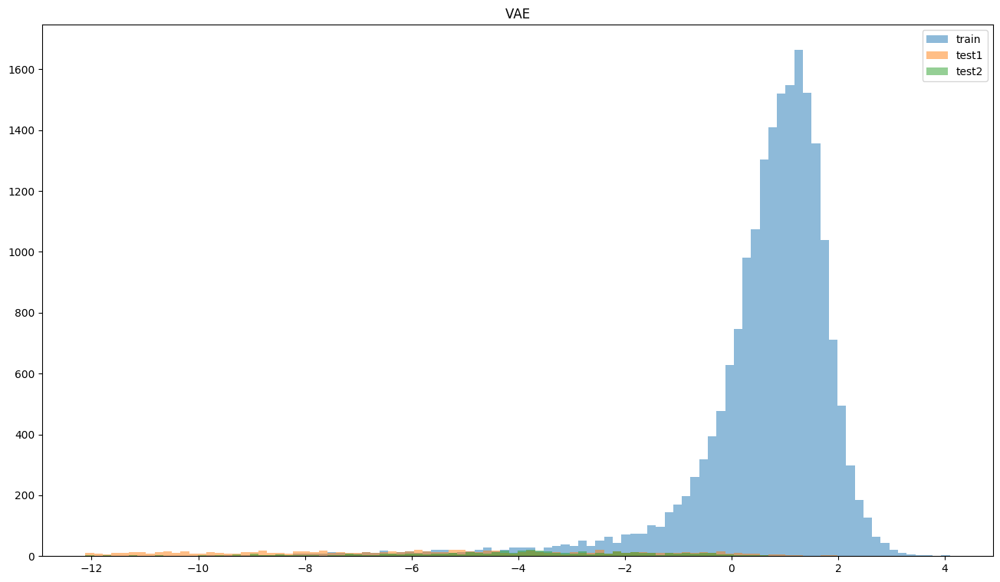

In [38]:
fig, ax1 = plt.subplots(1, 1, figsize=(16, 9))
bins = 100
counts, bin_edges = np.histogram(vae_elbo_train, bins=bins)
bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in range(len(bin_edges) - 1)]
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='train')
counts, _ = np.histogram(vae_elbo_test1, bins=bin_edges)
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='test1')
counts, _ = np.histogram(vae_elbo_test2, bins=bin_edges)
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='test2')
ax1.legend()
ax1.set_title('VAE')

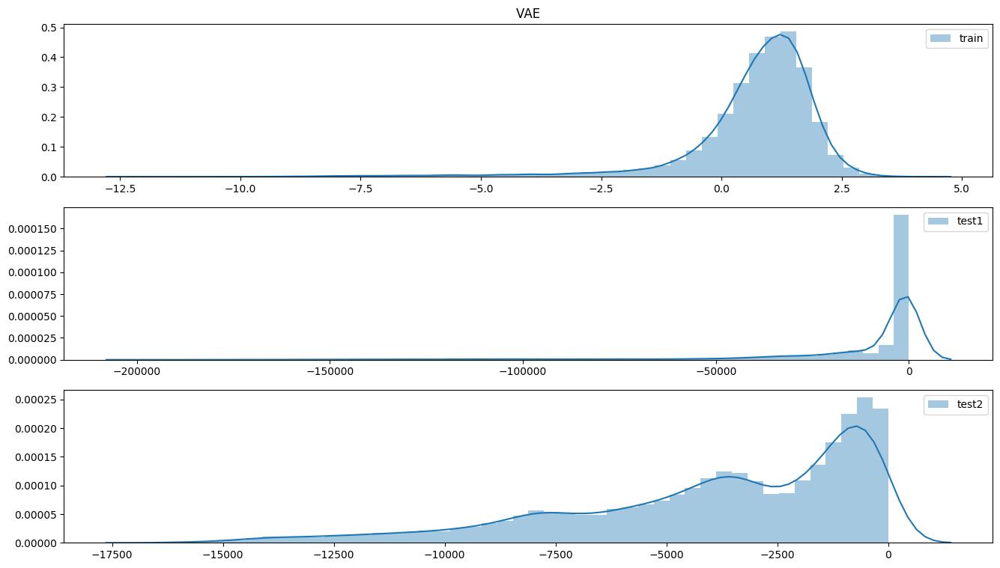

In [39]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 9))
seaborn.distplot(vae_elbo_train, ax=ax1, label='train')
seaborn.distplot(vae_elbo_test1, ax=ax2, label='test1')
seaborn.distplot(vae_elbo_test2, ax=ax3, label='test2')
ax1.set_title('VAE')
for ax in (ax1, ax2, ax3):
    ax.legend()

### HVAE

In [33]:
hvae_elbo_train, hvae_kl_train, hvae_likelihood_train = compute_elbo(hvae, x_train, importance_samples=10)
hvae_elbo_test1, hvae_kl_test1, hvae_likelihood_test1 = compute_elbo(hvae, x_test1, importance_samples=10)
hvae_elbo_test2, hvae_kl_test2, hvae_likelihood_test2 = compute_elbo(hvae, x_test2, importance_samples=10)

Text(0.5, 1.0, 'HVAE')

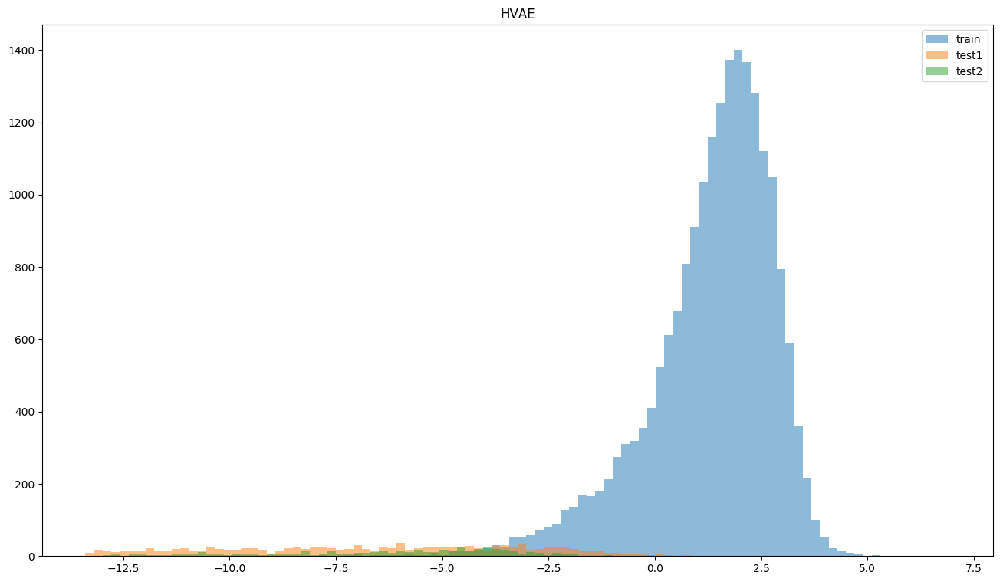

In [34]:
fig, ax1 = plt.subplots(1, 1, figsize=(16, 9))
bins = 100
counts, bin_edges = np.histogram(hvae_elbo_train, bins=bins)
bin_centers = [(bin_edges[i] + bin_edges[i+1]) / 2 for i in range(len(bin_edges) - 1)]
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='train')
counts, _ = np.histogram(hvae_elbo_test1, bins=bin_edges)
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='test1')
counts, _ = np.histogram(hvae_elbo_test2, bins=bin_edges)
ax1.hist(bin_centers, weights=counts, alpha=0.5, bins=bins, label='test2')
ax1.legend()
ax1.set_title('HVAE')

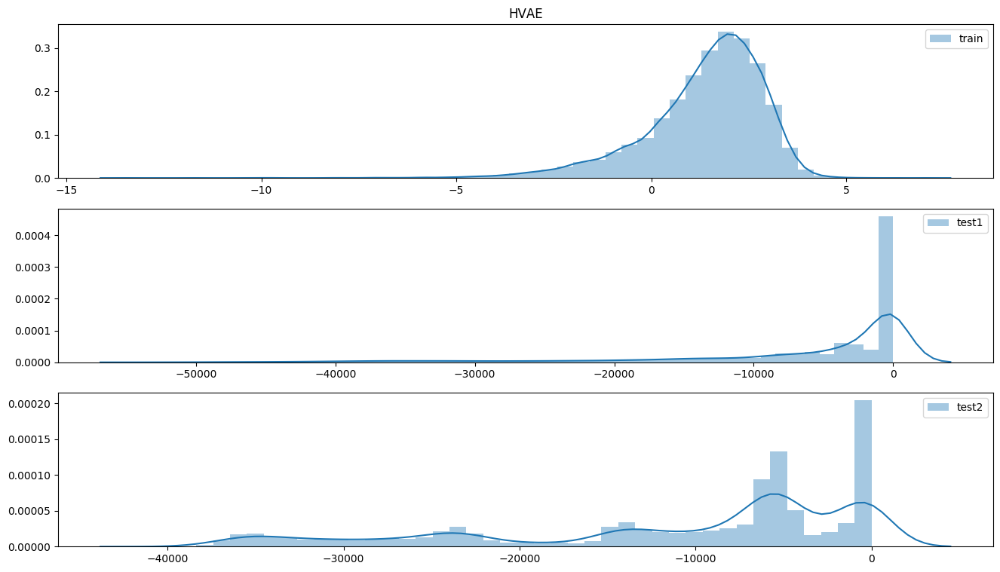

In [35]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 9))
seaborn.distplot(hvae_elbo_train, ax=ax1, label='train')
seaborn.distplot(hvae_elbo_test1, ax=ax2, label='test1')
seaborn.distplot(hvae_elbo_test2, ax=ax3, label='test2')
ax1.set_title('HVAE')
for ax in (ax1, ax2, ax3):
    ax.legend()

NameError: name 'vae_elbo_train' is not defined

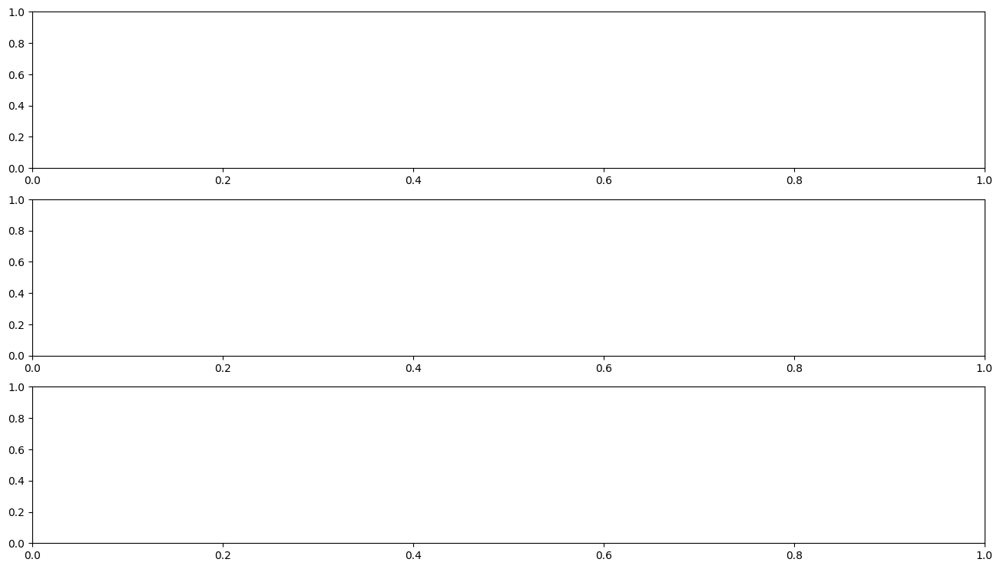

In [36]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(16, 9))
seaborn.distplot(vae_elbo_train, ax=ax1, label='VAE train')
seaborn.distplot(vae_elbo_test1, ax=ax2, label='VAE test1')
seaborn.distplot(vae_elbo_test2, ax=ax3, label='VAE test2')
ax1.set_title('VAE')
seaborn.distplot(hvae_elbo_train, ax=ax1, label='HVAE train')
seaborn.distplot(hvae_elbo_test1, ax=ax2, label='HVAE test1')
seaborn.distplot(hvae_elbo_test2, ax=ax3, label='HVAE test2')
ax1.set_title('HVAE')
for ax in (ax1, ax2, ax3):
    ax.legend()